- Should we log transform label encoded features
- Should we normalize label encoded features \ Doesn't really matter. May be considered as a bad practice
- How to find best lambda for Box-Cox transformation?
- How to accuratly separate data to categotical (for dummy transformation) and cont (for Box-Cox Transformation)
- Quick fillna with mode/median for missing values
- convert variables to categorical with astype(str)
- LabelEncoder 
- Use crossval with KFold for shuffling
- neg_mean_error: handling scores and losses in a proper way
- Simple stacking (class -> fit -> predict -> stack -> train)
- random forest for missing values

In [1]:
import pandas as pd
import numpy as np
import scipy as sc
import matplotlib.pyplot as plt
import lightgbm as lgb
import altair as alt
from altair.expr import datum

In [2]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [680]:
data_train = pd.read_csv(r'D:\HPDemo\Projects\Kaggle_house_price\train.csv')
data_test = pd.read_csv(r'D:\HPDemo\Projects\Kaggle_house_price\test.csv')

In [4]:
data_train.describe()

# присутствует колонка Id, которую необходимо удалить

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [681]:
train_id = data_train['Id']
test_id = data_test['Id']

print('data train shape is {} before removind ids\''.format(data_train.shape))
print('data test shape is {} before removind ids\''.format(data_test.shape))

data_train.drop(['Id'], axis=1, inplace=True)
data_test.drop(['Id'], axis=1, inplace=True)

print('data train shape is {} before removind ids\''.format(data_train.shape))
print('data test shape is {} before removind ids\''.format(data_test.shape))

data train shape is (1460, 81) before removind ids'
data test shape is (1459, 80) before removind ids'
data train shape is (1460, 80) before removind ids'
data test shape is (1459, 79) before removind ids'


### 1. Visualization

#### 1.1 Target Variable

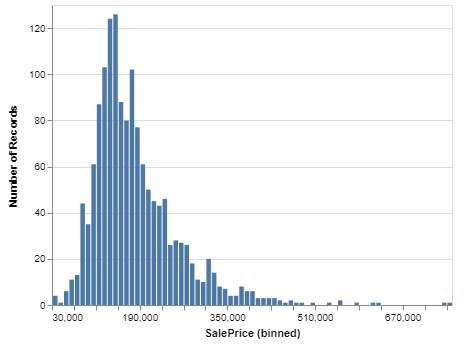

In [162]:
# Brief analysis of target variable

alt.Chart(data_train).mark_bar().encode(
    alt.X('SalePrice', bin=alt.Bin(step=10000)),
    y='count()'
)

In [250]:
print('Skewness is %0.2f' % data_train['SalePrice'].skew())
print('Kurtosis is %0.2f' % data_train['SalePrice'].kurt())

Skewness is 1.88
Kurtosis is 6.52


#### 1.2 Correlations

In [214]:
data_train_corr = data_train.corr()
data_train_corr['name'] = data_train_corr.index
data_train_long_corr = pd.melt(data_train_corr, id_vars=['name'])

# https://altair-viz.github.io/user_guide/data.html?highlight=wide#long-form-vs-wide-form-data

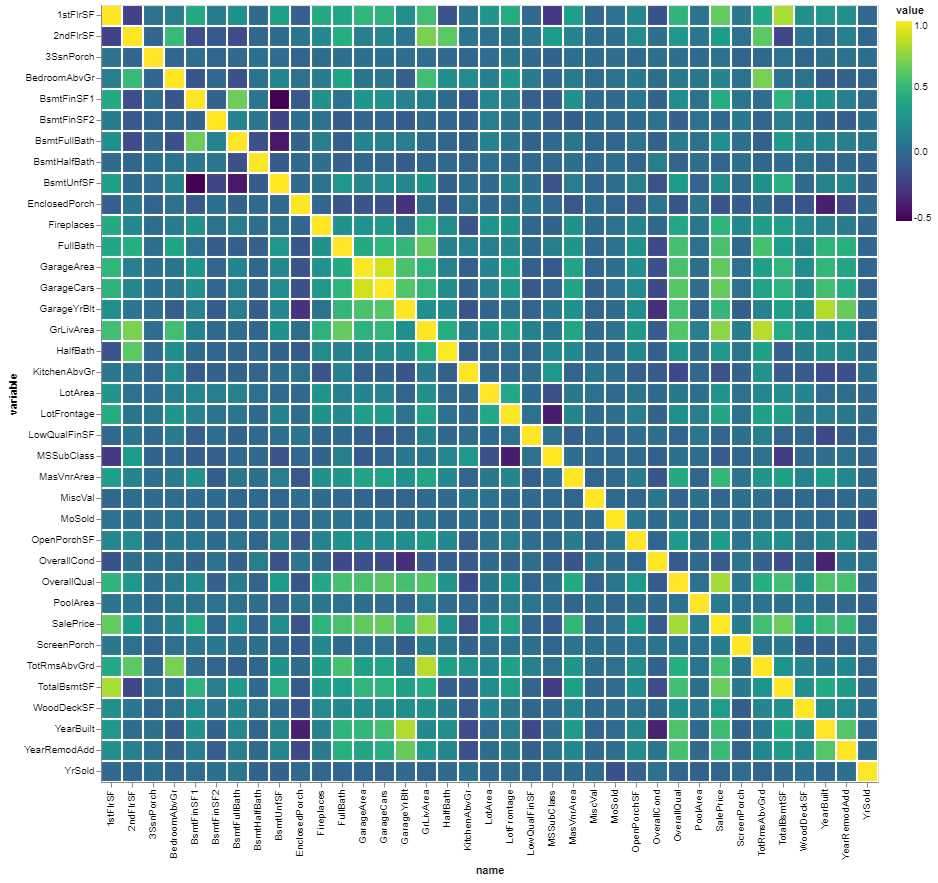

In [215]:
alt.Chart(data_train_long_corr).mark_rect().encode(
    x='name',
    y='variable',
    color='value'
)

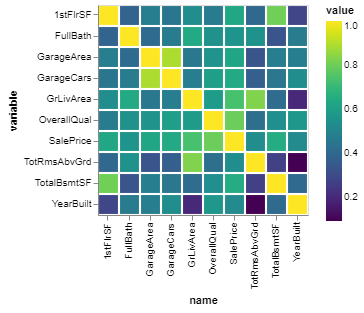

In [216]:
# Lets find out 10 most correlated variables 

cols = data_train_corr.nlargest(10, 'SalePrice')['SalePrice'].index
data_train_corr_10 = data_train[cols].corr()
data_train_corr_10['name'] = data_train_corr_10.index
data_train_long_corr_10 = pd.melt(data_train_corr_10, id_vars=['name'])

alt.Chart(data_train_long_corr_10).mark_rect().encode(
    x='name',
    y='variable',
    color='value'
)

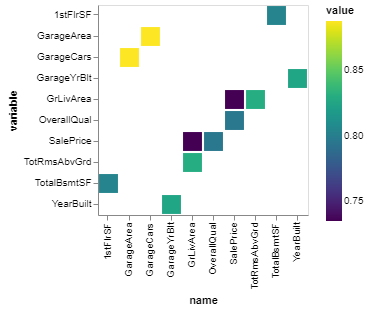

In [217]:
# There are several variables with high correlation that can lead to multicollinearity
# Lets invoke them and be prepared to remove some of them

alt.Chart(data_train_long_corr).mark_rect().encode(
    x='name',
    y='variable',
    color='value'
).transform_filter(
    alt.FieldRangePredicate(field='value', range=[0.70, 0.99])
)

# We have to choose between GarageArea and GarageCars, TotRmsAbvGrd and GrLivArea, YearBuilt and GarageYrBlt, TotalBsmtSF and 1stFlrSF
# We will leave those with higher correlation to target variable
# The winners are: GarageCars, GrLivArea, YearBuilt, TotalBsmtSF

#### 1.3 Jointplots

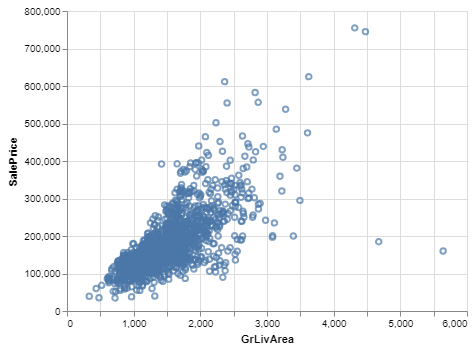

In [83]:
alt.Chart(data_train).mark_point().encode(
    alt.X('GrLivArea', scale=alt.Scale(zero=False)),
    alt.Y('SalePrice', scale=alt.Scale(zero=False)),
)

In [682]:
# We need to delete those 2 outliers with large area and low price - probably farmlands 

data_train.drop(data_train[(data_train['GrLivArea'] > 4000) & (data_train['SalePrice'] < 300000)].index, inplace=True)

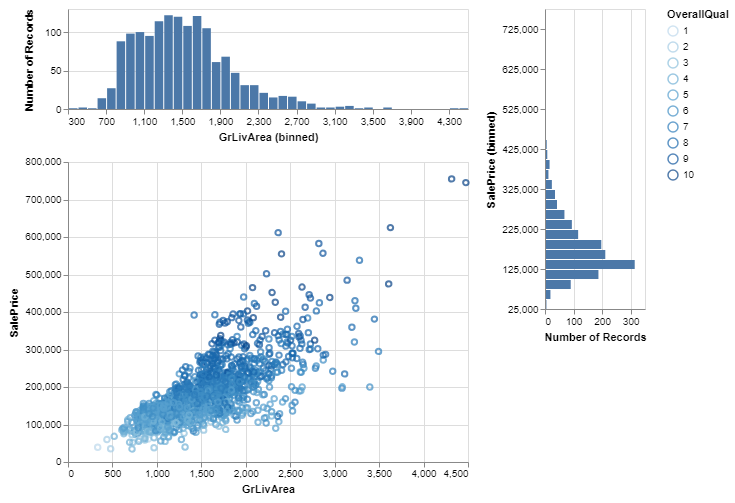

In [236]:
points = alt.Chart(data_train).mark_point().encode(
    alt.X('GrLivArea', scale=alt.Scale(zero=False)),
    alt.Y('SalePrice', scale=alt.Scale(zero=False)),
    alt.Color('OverallQual:O')
)

x_kde = alt.Chart(data_train).mark_bar().encode(
    alt.X('GrLivArea', bin=alt.Bin(step=100)),
    y='count()'
).properties(
    height=100
)

y_kde = alt.Chart(data_train).mark_bar().encode(
    alt.Y('SalePrice', bin=alt.Bin(step=25000)),
    x='count()'
).properties(
    width=100
)

(x_kde & points) | y_kde


# Actually after deleting 2 ouliers we have improved correlation between GrLivArea and Targer Variable

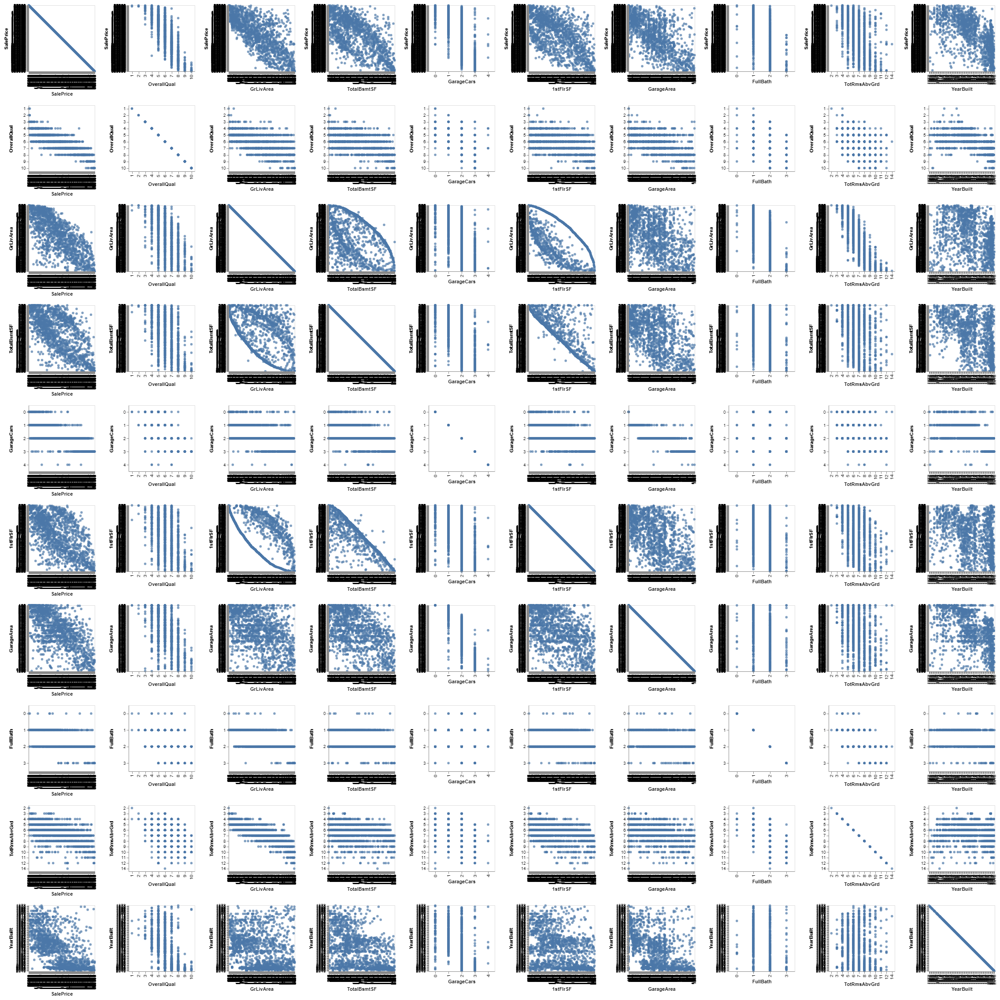

In [246]:
alt.Chart(data_train).mark_circle().encode(
    alt.X(alt.repeat('column'), type='nominal'),
    alt.Y(alt.repeat('row'), type='nominal')
).properties(
    width=150,
    height=150
).repeat(
    row=[x for x in data_train_corr_10.index],
    column=[x for x in data_train_corr_10.index]
)

### 2. Data Preprocessing

#### 2.1 Test data

In [683]:
# The test example with ID 666 has GarageArea, GarageCars, and GarageType 
# but none of the other fields, so use the mode and median to fill them in.

data_test.loc[666, "GarageQual"] = "TA"
data_test.loc[666, "GarageCond"] = "TA"
data_test.loc[666, "GarageFinish"] = "Unf"
data_test.loc[666, "GarageYrBlt"] = "1980"

# The test example 1116 only has GarageType but no other information. We'll 
# assume it does not have a garage

data_test.loc[1116, "GarageType"] = np.nan

#### 2.2 Dealing with missing data

In [352]:
lot_frontage_by_neigborhood = data_train['LotFrontage'].fillna(data_train.groupby(by=['Neighborhood'])['LotFrontage'].transform('median'))

In [349]:
missing_values = data_train.isnull().sum() / len(data_train)
missing_values = missing_values.drop(missing_values[missing_values == 0].index).sort_values(ascending=False)
missing_values = pd.DataFrame({'Missing ratio': missing_values})

In [8]:
le = LabelEncoder()

In [684]:
def factorize(data: pd.DataFrame, column: str) -> pd.DataFrame:
    '''
    Convert categorical features into ordinal
    
    :param data:
        Dataset from kaggle house_price_prediction
    :param column:
        Column name to convets
    :return:
        Dataset with column feature converted to ordinal
    '''
    le.fit(data[column].unique())
    data[column] = le.transform(data[column])
    return data

In [353]:
def processing(data:pd.DataFrame) -> pd.DataFrame:
    '''
    Main steps of data preprocessing:
    - Manage missing values
    - Convert quality measures from text to integer
    - Creating dummy variables
    - Crating new features
    - Simplification of existing features 
    
    :param data:
        Dataset from kaggle house_price_prediction
    :return:
        Preprocessed dataset
    '''
    
    # Missing values
    df = pd.DataFrame(index=data.index)
#    df = df.copy()
    df['1stFlrSF'] = data['1stFlrSF']
    df['2ndFlrSF'] = data['2ndFlrSF']
    df['3SsnPorch'] = data['3SsnPorch']
    df['Alley'] = data['Alley']
#    df['Alley'].fillna('None', inplace=True)
    df['BedroomAbvGr'] = data['BedroomAbvGr']
    df['BldgType'] = data['BldgType']
    df['BsmtCond'] = data['BsmtCond']
#    df['BsmtCond'].fillna('None', inplace=True)
    df['BsmtExposure'] = data['BsmtExposure']
#   df['BsmtExposure'].fillna('None', inplace=True)
    df['BsmtFinSF1'] = data['BsmtFinSF1']
    df['BsmtFinSF1'].fillna(0.0, inplace=True)
    df['BsmtFinSF2'] = data['BsmtFinSF2']
    df['BsmtFinSF2'].fillna(0.0, inplace=True)
    df['BsmtFinType1'] = data['BsmtFinType1']
#    df['BsmtFinType1'].fillna('None', inplace=True)
    df['BsmtFinType2'] = data['BsmtFinType2']
#    df['BsmtFinType2'].fillna('None', inplace=True)
    df['BsmtFullBath'] = data['BsmtFullBath']
    df['BsmtFullBath'].fillna(0.0, inplace=True)
    df['BsmtHalfBath'] = data['BsmtHalfBath']
    df['BsmtHalfBath'].fillna(0.0, inplace=True)
    df['BsmtQual'] = data['BsmtQual']
#    df['BsmtQual'].fillna('None', inplace=True)
    df['BsmtUnfSF'] = data['BsmtUnfSF']
    df['BsmtUnfSF'].fillna(0.0, inplace=True)
    df['CentralAir'] = data['CentralAir']
    df['Condition1'] = data['Condition1']
    df['Condition2'] = data['Condition2']
    df['Electrical'] = data['Electrical']
    df['Electrical'].fillna('SBrkr', inplace=True)
    df['EnclosedPorch'] = data['EnclosedPorch']
    df['ExterCond'] = data['ExterCond']
    df['ExterQual'] = data['ExterQual']
    df['Exterior1st'] = data['Exterior1st']
    df['Exterior1st'].fillna('VinylSd', inplace=True)
    df['Exterior2nd'] = data['Exterior2nd']
    df['Exterior2nd'].fillna('VinylSd', inplace=True)    
    df['Fence'] = data['Fence']
    df['Fence'].fillna('None')
    df['FireplaceQu'] = data['FireplaceQu']
#    df['FireplaceQu'].fillna('None', inplace=True)
    df['Fireplaces'] = data['Fireplaces']
    df['Foundation'] = data['Foundation']
    df['FullBath'] = data['FullBath']
    df['Functional'] = data['Functional']
    df['Functional'].fillna('Typ', inplace=True)
    df['GarageArea'] = data['GarageArea']
    df['GarageArea'].fillna(data_train['GarageArea'].median(), inplace=True)
    df['GarageCars'] = data['GarageCars']
    df['GarageCars'].fillna(2, inplace=True)
    df['GarageCond'] = data['GarageCond']
#    df['GarageCond'].fillna('None', inplace=True)
    df['GarageFinish'] = data['GarageFinish']
#   df['GarageFinish'].fillna('None', inplace=True)
    df['GarageQual'] = data['GarageQual']
#    df['GarageQual'].fillna('None', inplace=True)
    df['GarageType'] = data['GarageType']
    df['GarageType'].fillna('None', inplace=True)
    df['GarageYrBlt'] = data['GarageYrBlt']
    df['GarageYrBlt'].fillna(0.0, inplace=True)
    df['GrLivArea'] = data['GrLivArea']
    df['HalfBath'] = data['HalfBath']
    df['HalfBath'].fillna(0.0, inplace=True)
    df['Heating'] = data['Heating']
    df['HeatingQC'] = data['HeatingQC']
    df['HouseStyle'] = data['HouseStyle']
    df['KitchenAbvGr'] = data['KitchenAbvGr']
    df['KitchenQual'] = data['KitchenQual']
    df['KitchenQual'].fillna('TA', inplace=True)
    df['LandContour'] = data['LandContour']
    df['LandSlope'] = data['LandSlope']
    df['LotArea'] = data['LotArea']
    df['LotConfig'] = data['LotConfig']
    df['LotFrontage'] = data['LotFrontage']
    df['LotFrontage'].fillna(data_train.groupby(by=['Neighborhood'])['LotFrontage'].transform('median'), inplace=True)
    df['LotShape'] = data['LotShape']
    df['LowQualFinSF'] = data['LowQualFinSF']
    df['MSSubClass'] = data['MSSubClass']
    df['MSZoning'] = data['MSZoning']
    df['MSZoning'].fillna('RL', inplace=True)
    df['MasVnrType'] = data['MasVnrType']
    df['MasVnrType'].fillna('None', inplace=True)
    df['MasVnrArea'] = data['MasVnrArea']
    df['MasVnrArea'].fillna(0.0, inplace=True)
    df['MiscFeature'] = data['MiscFeature']
    df['MiscFeature'].fillna('None', inplace=True)
    df['MiscVal'] = data['MiscVal']
    df['MoSold'] = data['MoSold']
    df['Neighborhood'] = data['Neighborhood']
    df['OpenPorchSF'] = data['OpenPorchSF']
    df['OverallCond'] = data['OverallCond']
    df['OverallQual'] = data['OverallQual']
    df['PavedDrive'] = data['PavedDrive']
    df['PoolArea'] = data['PoolArea']
    df['PoolQC'] = data['PoolQC']
    df['RoofMatl'] = data['RoofMatl']
    df['RoofStyle'] = data['RoofStyle']
    df['SaleCondition'] = data['SaleCondition']
    df['SaleType'] = data['SaleType']
    df['SaleType'].fillna('WD', inplace=True)
    df['ScreenPorch'] = data['ScreenPorch']
    df['Street'] = data['Street']
    df['TotRmsAbvGrd'] = data['TotRmsAbvGrd']
    df['TotalBsmtSF'] = data['TotalBsmtSF']
    df['TotalBsmtSF'].fillna(0.0, inplace=True)
    df['Utilities'] = data['Utilities']
    df['Utilities'].fillna('AllPub', inplace=True)
    df['WoodDeckSF'] = data['WoodDeckSF']
    df['YearBuilt'] = data['YearBuilt']
    df['YearRemodAdd'] = data['YearRemodAdd']
    df['YrSold'] = data['YrSold']
    
    #Convert quality variables
    qual_dict = {None: 0, "Po": 1, "Fa": 2, "TA": 3, "Gd": 4, "Ex": 5}
    df["ExterQual"] = df["ExterQual"].map(qual_dict)
    df["ExterCond"] = df["ExterCond"].map(qual_dict)
    df['BsmtQual'] = df['BsmtQual'].map(qual_dict)
    df["BsmtCond"] = df["BsmtCond"].map(qual_dict)
    df["HeatingQC"] = df["HeatingQC"].map(qual_dict)
    df["KitchenQual"] = df["KitchenQual"].map(qual_dict)
    df["FireplaceQu"] = df["FireplaceQu"].map(qual_dict)
    df["GarageQual"] = df["GarageQual"].map(qual_dict)
    df["GarageCond"] = df["GarageCond"].map(qual_dict)
    df["PoolQC"] = df["PoolQC"].map(qual_dict)

    df["BsmtExposure"] = df["BsmtExposure"].map(
        {None: 0, "No": 1, "Mn": 2, "Av": 3, "Gd": 4})

    bsmt_fin_dict = {None: 0, "Unf": 1, "LwQ": 2, "Rec": 3, "BLQ": 4, "ALQ": 5, "GLQ": 6}
    df["BsmtFinType1"] = df["BsmtFinType1"].map(bsmt_fin_dict)
    df["BsmtFinType2"] = df["BsmtFinType2"].map(bsmt_fin_dict)

    df["Functional"] = df["Functional"].map(
        {None: 0, "Sal": 1, "Sev": 2, "Maj2": 3, "Maj1": 4, 
         "Mod": 5, "Min2": 6, "Min1": 7, "Typ": 8})

    df["GarageFinish"] = df["GarageFinish"].map(
        {None: 0, "Unf": 1, "RFn": 2, "Fin": 3})

    df["Fence"] = df["Fence"].map(
        {None: 0, "MnWw": 1, "GdWo": 2, "MnPrv": 3, "GdPrv": 4})

    df['Neighborhoodgood'] = df['Neighborhood']
    df['Neighborhoodgood'] = df['Neighborhoodgood'].map(
        {'CollgCr': 0, 'Veenker': 0, 'Crawfor': 1, 'NoRidge': 1, 'Mitchel': 0, 'Somerst': 1,
         'NWAmes': 0, 'OldTown': 0, 'BrkSide': 0, 'Sawyer': 0, 'NridgHt': 1, 'NAmes': 0,
         'SawyerW': 0, 'IDOTRR': 0, 'MeadowV': 0, 'Edwards': 0, 'Timber': 0, 'Gilbert': 0,
         'StoneBr': 1, 'ClearCr': 0, 'NPkVill': 0, 'Blmngtn': 0, 'BrDale': 0, 'SWISU': 0,
         'Blueste': 0})
    
    df["SaleCondition_PriceDown"] = df['SaleCondition']
    df["SaleCondition_PriceDown"] = df['SaleCondition_PriceDown'].map(
        {'Abnorml': 1, 'Alloca': 1, 'AdjLand': 1, 'Family': 1, 'Normal': 0, 'Partial': 0})
    
    df["NewerDwelling"] = df["MSSubClass"].map(
        {20: 1, 30: 0, 40: 0, 45: 0,50: 0, 60: 1, 70: 0, 75: 0, 80: 0, 85: 0,
         90: 0, 120: 1, 150: 0, 160: 0, 180: 0, 190: 0}) 
    
    # House completed before sale or not
    df["BoughtOffPlan"] = df['SaleCondition']
    df["BoughtOffPlan"] = df['BoughtOffPlan'].map(
        {'Abnorml': 0, 'Alloca': 0, 'AdjLand': 0, 'Family': 0, 'Normal': 0, 'Partial': 1})
    
    df['BadHeating'] = df['HeatingQC']
    df['BadHeating'] = df['BadHeating'].map(
        {5: 0, 4: 0, 3: 0, 2: 1, 1: 1})
    
    df['Alley'] = df['Alley'].map(
        {None: 0, 'Grvl': 1, 'Pave': 1})
    
    #convert variables to ordinal
    df = factorize(df,'MSSubClass')
    df = factorize(df,'MSZoning')
    df = factorize(df,'LotConfig')
    df = factorize(df,'Neighborhood')
    df = factorize(df,'Condition1')
    df = factorize(df,'BldgType')
    df = factorize(df,'HouseStyle')
    df = factorize(df,'RoofStyle')
    df = factorize(df,'Exterior1st')
    df = factorize(df,'Exterior2nd')
    df = factorize(df,'MasVnrType')
    df = factorize(df,'Foundation')
    df = factorize(df,'SaleType')
    df = factorize(df,'SaleCondition')
    
    df["IsRegularLotShape"] = (df["LotShape"] == "Reg") * 1

    # Most properties are level; bin the other possibilities together
    # as "not level".
    df["IsLandLevel"] = (df["LandContour"] == "Lvl") * 1

    # Most land slopes are gentle; treat the others as "not gentle".
    df["IsLandSlopeGentle"] = (df["LandSlope"] == "Gtl") * 1

    # Most properties use standard circuit breakers.
    df["IsElectricalSBrkr"] = (df["Electrical"] == "SBrkr") * 1

    # About 2/3rd have an attached garage.
    df["IsGarageDetached"] = (df["GarageType"] == "Detchd") * 1

    # Most have a paved drive. Treat dirt/gravel and partial pavement
    # as "not paved".
    df["IsPavedDrive"] = (df["PavedDrive"] == "Y") * 1

    # The only interesting "misc. feature" is the presence of a shed.
    df["HasShed"] = (df["MiscFeature"] == "Shed") * 1.  

    # If YearRemodAdd != YearBuilt, then a remodeling took place at some point.
    df["Remodeled"] = (df["YearRemodAdd"] != df["YearBuilt"]) * 1
    
    # Did a remodeling happen in the year the house was sold?
    df["RecentRemodel"] = (df["YearRemodAdd"] == df["YrSold"]) * 1
    
    # Was this house sold in the year it was built?
    df["VeryNewHouse"] = (df["YearBuilt"] == df["YrSold"]) * 1

    df["Has2ndFloor"] = (df["2ndFlrSF"] == 0) * 1
    df["HasMasVnr"] = (df["MasVnrArea"] == 0) * 1
    df["HasWoodDeck"] = (df["WoodDeckSF"] == 0) * 1
    df["HasOpenPorch"] = (df["OpenPorchSF"] == 0) * 1
    df["HasEnclosedPorch"] = (df["EnclosedPorch"] == 0) * 1
    df["Has3SsnPorch"] = (df["3SsnPorch"] == 0) * 1
    df["HasScreenPorch"] = (df["ScreenPorch"] == 0) * 1
    
    # Overall quality of the house
    df["OverallGrade"] = df["OverallQual"] * df["OverallCond"]
    # Overall quality of the garage
    df["GarageGrade"] = df["GarageQual"] * df["GarageCond"]
    # Overall quality of the exterior
    df["ExterGrade"] = df["ExterQual"] * df["ExterCond"]
    # Overall kitchen score
    df["KitchenScore"] = df["KitchenAbvGr"] * df["KitchenQual"]
    # Overall fireplace score
    df["FireplaceScore"] = df["Fireplaces"] * df["FireplaceQu"]
    # Overall garage score
    df["GarageScore"] = df["GarageArea"] * df["GarageQual"]
    # Overall pool score
    df["PoolScore"] = df["PoolArea"] * df["PoolQC"]
    
    df["HighSeason"] = df["MoSold"].map( 
        {1: 0, 2: 0, 3: 0, 4: 1, 5: 1, 6: 1, 7: 1, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0})



    area_cols = ['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
                 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageArea', 'WoodDeckSF', 
                 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'LowQualFinSF', 'PoolArea' ]
    df['TotalArea'] = df[area_cols].sum(axis=1)

    df["TotalArea1st2nd"] = df["1stFlrSF"] + df["2ndFlrSF"]

    df["Age"] = 2010 - df["YearBuilt"]
    df["TimeSinceSold"] = 2010 - df["YrSold"]

    df["SeasonSold"] = df["MoSold"].map({12:0, 1:0, 2:0, 3:1, 4:1, 5:1, 
                                         6:2, 7:2, 8:2, 9:3, 10:3, 11:3}).astype(int)
    
    df["YearsSinceRemodel"] = df["YrSold"] - df["YearRemodAdd"]
    
    # Simplifications of existing features into bad/average/good.
    df["SimplOverallQual"] = df['OverallQual'].map(
        {1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2, 6 : 2, 7 : 3, 8 : 3, 9 : 3, 10 : 3})
    df["SimplOverallCond"] = df['OverallCond'].map(
        {1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2, 6 : 2, 7 : 3, 8 : 3, 9 : 3, 10 : 3})
    df["SimplPoolQC"] = df['PoolQC'].map(
        {0: 0, 1 : 1, 2 : 1, 3 : 2, 4 : 2, 5: 2})
    df["SimplGarageCond"] = df['GarageCond'].map(
        {0: 0, 1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2})
    df["SimplGarageQual"] = df['GarageQual'].map(
        {0: 0, 1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2})
    df["SimplFireplaceQu"] = df['FireplaceQu'].map(
        {0: 0, 1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2})
    df["SimplFunctional"] = df['Functional'].map(
        {1 : 1, 2 : 1, 3 : 2, 4 : 2, 5 : 3, 6 : 3, 7 : 3, 8 : 4})
    df["SimplKitchenQual"] = df['KitchenQual'].map(
        {1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2})
    df["SimplHeatingQC"] = df['HeatingQC'].map(
        {1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2})
    df["SimplBsmtFinType1"] = df['BsmtFinType1'].map(
        {0: 0, 1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2, 6 : 2})
    df["SimplBsmtFinType2"] = df['BsmtFinType2'].map(
        {0: 0, 1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2, 6 : 2})
    df["SimplBsmtCond"] = df['BsmtCond'].map(
        {0: 0, 1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2})
    df["SimplBsmtQual"] = df['BsmtQual'].map(
        {0: 0, 1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2})
    df["SimplExterCond"] = df['ExterCond'].map(
        {1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2})
    df['SimplExterQual'] = df['ExterQual'].map(
        {1 : 1, 2 : 1, 3 : 1, 4 : 2, 5 : 2})
            
    # Bin by neighborhood (a little arbitrarily). Values were computed by: 
    # train_df["SalePrice"].groupby(train_df["Neighborhood"]).median().sort_values()
    neighborhood_map = {
        "MeadowV" : 0,  #  88000
        "IDOTRR" : 1,   # 103000
        "BrDale" : 1,   # 106000
        "OldTown" : 1,  # 119000
        "Edwards" : 1,  # 119500
        "BrkSide" : 1,  # 124300
        "Sawyer" : 1,   # 135000
        "Blueste" : 1,  # 137500
        "SWISU" : 2,    # 139500
        "NAmes" : 2,    # 140000
        "NPkVill" : 2,  # 146000
        "Mitchel" : 2,  # 153500
        "SawyerW" : 2,  # 179900
        "Gilbert" : 2,  # 181000
        "NWAmes" : 2,   # 182900
        "Blmngtn" : 2,  # 191000
        "CollgCr" : 2,  # 197200
        "ClearCr" : 3,  # 200250
        "Crawfor" : 3,  # 200624
        "Veenker" : 3,  # 218000
        "Somerst" : 3,  # 225500
        "Timber" : 3,   # 228475
        "StoneBr" : 4,  # 278000
        "NoRidge" : 4,  # 290000
        "NridgHt" : 4,  # 315000
    }

    df["NeighborhoodBin"] = data["Neighborhood"].map(neighborhood_map)
    
    return df

In [685]:
data_train_pro = processing(data_train)
data_test_pro = processing(data_test)

In [687]:
neighborhood_bin_train = pd.DataFrame(index=data_train_pro.index)
neighborhood_bin_train['NeighborhoodBin'] = data_train_pro['NeighborhoodBin']
neighborhood_bin_test = pd.DataFrame(index=data_test_pro.index)
neighborhood_bin_test['NeighborhoodBin'] = data_test_pro['NeighborhoodBin']

In [688]:
exclude = ['Alley', 'BldgType', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtQual', 'Condition1',
           'ExterCond', 'ExterQual', 'Exterior1st', 'Exterior2nd', 'Fence', 'FireplaceQu',
           'Foundation', 'Functional', 'GarageQual', 'GarageCond', 'GarageFinish', 'HeatingQC', 'HouseStyle', 'KitchenQual',
           'LotConfig', 'MSZoning', 'MoSold', 'Neighborhood', 'RoofStyle', 'SaleCondition' , 'SaleType', 'MSSubClass', 'PoolQC']

In [689]:
numeric_features = data_train_pro.select_dtypes(include='number').columns
numeric_features = numeric_features.drop(['YearBuilt', 'YearsSinceRemodel', 'YearRemodAdd', 'YrSold', 'GarageYrBlt'])
numeric_features = numeric_features.drop(exclude)

In [690]:
def skewed(data: pd.DataFrame, features: list):
    '''
    Get rid of skeweness for dataset variables
    
    :param data:
        Dataset from kaggle house_price_prediction
    :param features:
        List of numerical variables
    :return:
        Dataset with applied log transformation for skewed variables
    '''
    skewed = data[features].apply(lambda x: x.dropna().astype(float).skew())
    skewed = skewed[skewed > 0.75]
    skewed = skewed.index
    
    data[skewed] = np.log1p(data[skewed])
    return data

def scaled(data: pd.DataFrame, features: list):
    '''
    normalize dataset variables
    train set parameters are applied to training set
    
    :param data:
        Dataset from kaggle house_price_prediction
    :param features:
        List of numerical variables
    :return:
        Normalized dataset variables    
    '''
    scaler = StandardScaler()
    scaler.fit(data_train_pro_sk[features])
    data[features] = scaler.transform(data[features])
    return data

def onehot_df(data: pd.DataFrame, column_name: str):
    '''
    Creating dummy variables
    
    :param data:
        Dataset from kaggle house_price_prediction
    :param column_name:
        column name to create dummies
    :return:
        Dataset with dummies
    '''
    dummies = pd.get_dummies(data[column_name], prefix='_' + column_name)
    return dummies



def year_bin(data: pd.DataFrame, column_name: str):
    '''
    Creating binned variables for years_variables
    
    :param data:
        Dataset from kaggle house_price_prediction
    :param column_name:
        column name to create dummies
    :return:
        Dataset with binned variables
    '''
    year_bin_df = pd.DataFrame(index=data.index)
    year_map = pd.cut(data[column_name].fillna('NoGarage'), bins=7, labels=[column_name + str(i) for i in range(7)])
    column_name_bin = column_name + 'Bin'
    year_bin_df[column_name_bin] = year_map
    year_bin_df = onehot_df(year_bin_df, column_name_bin)
    data = data.join(year_bin_df)
    return data

In [693]:
data_train_pro_sk = skewed(data_train_pro, numeric_features)
data_test_pro_sk = skewed(data_test_pro, numeric_features)

In [694]:
data_train_pro_sk_s = scaled(data_train_pro_sk, numeric_features)
data_test_pro_sk_s = scaled(data_test_pro_sk, numeric_features)

In [696]:
data_for_dummies = ['MSSubClass', 'MSZoning', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle',
                    'RoofStyle', 'Exterior1st', 'Exterior2nd', 'Foundation', 'SaleType', 'SaleCondition',
                    "LotShape", "LandContour", "LandSlope", "Electrical", "GarageType", "PavedDrive", "MiscFeature", "Street", "Alley",
                    "Condition2", "RoofMatl", "Heating", "ExterQual", "ExterCond", "BsmtQual", "BsmtCond", "HeatingQC", "KitchenQual",
                    "FireplaceQu", "GarageQual", "GarageCond", "PoolQC", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "Functional",
                    "GarageFinish", "Fence", "MoSold", 'CentralAir']

data_for_binning = ['GarageYrBlt', 'YearBuilt', 'YearRemodAdd']

In [697]:
df_train = data_train_pro_sk_s.copy()
for i in data_for_dummies:
    dummy = onehot_df(data_train_pro_sk_s, i)
    df_train = pd.concat([df_train, dummy], axis=1)
    df_train.drop(i, inplace=True, axis=1)

df_test = data_test_pro_sk_s.copy()
for i in data_for_dummies:
    dummy = onehot_df(data_test_pro_sk_s, i)
    df_test = pd.concat([df_test, dummy], axis=1)
    df_test.drop(i, inplace=True, axis=1)

df_train = pd.concat([df_train, pd.get_dummies(neighborhood_bin_train['NeighborhoodBin'])], axis=1)
df_test = pd.concat([df_test, pd.get_dummies(neighborhood_bin_test['NeighborhoodBin'])], axis=1)

year_map = pd.concat(pd.Series("YearBin" + str(i+1), index=range(1871+i*20,1871+(i+1)*20)) for i in range(0, 7))

df_train_b = df_train.copy()
for i in data_for_binning:
    binn = df_train[i].map(year_map)
    dummy = pd.get_dummies(binn, prefix='_' + str(i))
    df_train_b = pd.concat([df_train_b, dummy], axis=1)
    df_train_b.drop(i, inplace=True, axis=1)

df_test_b = df_test.copy()
for i in data_for_binning:
    binn = df_test[i].map(year_map)
    dummy = pd.get_dummies(binn, prefix='_' + str(i))
    df_test_b = pd.concat([df_test_b, dummy], axis=1)
    df_test_b.drop(i, inplace=True, axis=1)

In [699]:
columns_to_drop = [x for x in (set(df_train_b.columns) - set(df_test_b.columns))]
df_train_b.drop(columns_to_drop, inplace=True, axis=1)
columns_to_drop = [x for x in (set(df_test_b.columns) - set(df_train_b.columns))]
df_test_b.drop(columns_to_drop, inplace=True, axis=1)
columns_to_drop = ['_MSSubClass_2', '_Condition2_PosN', '_MSZoning_0', '_MSZoning_2', 'Utilities']
df_train_b.drop(columns_to_drop, inplace=True, axis=1)
df_test_b.drop(columns_to_drop, inplace=True, axis=1)

In [659]:
#label_df = pd.DataFrame(index=df_train_b.index, columns=['SalePrice'])
label = pd.Series(np.log1p(data_train['SalePrice']))

In [660]:
clf_df_trian = lgb.Dataset(df_train_b, label=label)

In [730]:
param = {} 
param['objective'] = 'regression'
param['learning_rate'] = 0.005
param['boosting_type'] = 'gbdt'
param['metric'] = 'l2'
param['max_depth'] = 2
param['feature_fraction'] = 0.8
param['num_iteration'] = 10000
param['num_leaves'] = 5
param['n_estimators'] = 720,
param['max_bin'] = 55, 
param['bagging_fraction'] = 0.8
param['bagging_freq'] = 5
param['feature_fraction_seed'] = 9
param['bagging_seed'] = 9
param['min_data_in_leaf'] = 6
param['min_sum_hessian_in_leaf'] = 11

In [731]:
clf = lgb.train(param, clf_df_trian)

D:\Anaconda\envs\classic_jl_lgbm\lib\site-packages\lightgbm\engine.py:102: UserWarning: Found `num_iteration` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


In [732]:
pred = clf.predict(df_test_b)
pred = np.exp(pred)
solution = pd.DataFrame(pred, index=test_id, columns=['SalePrice'])
solution.to_csv('submission_one.csv', index_label='Id', header=True)

In [639]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score

In [645]:
pred

array([129104.36556681, 125354.35281959, 185706.11437465, ...,
       189391.52555897, 182092.4184139 , 185706.11437465])

In [643]:
clf = linear_model.ElasticNet()
clf.fit(df_train_b, label_df)
pred = clf.predict(df_test_b)
pred = np.exp(pred)
solution = pd.DataFrame(pred, index=test_id, columns=['SalePrice'])
solution.to_csv('submission_one.csv', index_label='Id', header=True)